# Educational Process Mining

https://archive-beta.ics.uci.edu/dataset/346/educational+process+mining+epm+a+learning+analytics+data+set

Educational Process Mining (EPM): A Learning Analytics Data Set. (2015). UCI Machine Learning Repository.

There are 6 sessions with student input data and two excel files with intermediate and final grades. This EDA explores Session 1 data and the grade output data.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

### Load the data from github repository

In [2]:
inputs_path_1 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p1.csv'
inputs_path_2 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p2.csv'
inputs_path_3 = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/inputs_clean_p3.csv'
interim_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/interim_df.csv'
final_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/final_df.csv'
pts_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/points_final.csv'

In [3]:
inputs_p1 = pd.read_csv(inputs_path_1)

In [4]:
inputs_p2 = pd.read_csv(inputs_path_2)

In [5]:
inputs_p3 = pd.read_csv(inputs_path_3)

In [6]:
inputs_init = pd.concat([inputs_p1, inputs_p2, inputs_p3], ignore_index=True, axis=0)

In [7]:
interim_init = pd.read_csv(interim_path)

In [8]:
final_init = pd.read_csv(final_path)

In [9]:
pts_final_init = pd.read_csv(pts_path)

In [10]:
inputs_init.columns

Index(['Unnamed: 0', 'session', 'student_id', 'exercise', 'activity',
       'activity_grp', 'activity_ex', 'start_time', 'end_time', 'total_time',
       'idle_time', 'mouse_wheel', 'mouse_wheel_click', 'mouse_click_left',
       'mouse_click_right', 'mouse_movement', 'keystroke', 'active_time',
       'ttime_ln', 'itime_ln', 'mw_ln', 'mwc_ln', 'mcl_ln', 'mcr_ln', 'mm_ln',
       'ks_ln', 'mw_wdz', 'mwc_wdz', 'mcl_wdz', 'mcr_wdz', 'mm_wdz', 'ks_wdz',
       'ttime_sqrt', 'itime_sqrt', 'mw_sqrt', 'mwc_sqrt', 'mcl_sqrt',
       'mcr_sqrt', 'mm_sqrt', 'ks_sqrt'],
      dtype='object')

In [11]:
interim_init.columns

Index(['Unnamed: 0', 'student_id', 'session_2', 'session_3', 'session_4',
       'session_5', 'session_6'],
      dtype='object')

In [12]:
final_init.columns

Index(['Unnamed: 0', 'student_id', 'Es_1_1', 'Es_1_2', 'Es_2_1', 'Es_2_2',
       'Es_3_1', 'Es_3_2', 'Es_3_3', 'Es_3_4', 'Es_3_5', 'Es_4_1', 'Es_4_2',
       'Es_5_1', 'Es_5_2', 'Es_5_3', 'Es_6_1', 'Es_6_2', 'final_score'],
      dtype='object')

In [13]:
pts_final_init.columns

Index(['Unnamed: 0', 'question', 'question_pts'], dtype='object')

##### Drop Unnamed columns

In [14]:
inputs_init.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
interim_init.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
final_init.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
pts_final_init.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

## Inputs

In [15]:
inputs_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 39 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   session            227129 non-null  int64  
 1   student_id         227129 non-null  int64  
 2   exercise           227129 non-null  object 
 3   activity           227129 non-null  object 
 4   activity_grp       227129 non-null  object 
 5   activity_ex        111979 non-null  object 
 6   start_time         227128 non-null  object 
 7   end_time           227129 non-null  object 
 8   total_time         167361 non-null  float64
 9   idle_time          226971 non-null  float64
 10  mouse_wheel        227129 non-null  int64  
 11  mouse_wheel_click  227129 non-null  int64  
 12  mouse_click_left   227129 non-null  int64  
 13  mouse_click_right  227129 non-null  int64  
 14  mouse_movement     227129 non-null  int64  
 15  keystroke          227129 non-null  int64  
 16  ac

In [16]:
inputs_init.isna().sum()

session                   0
student_id                0
exercise                  0
activity                  0
activity_grp              0
activity_ex          115150
start_time                1
end_time                  0
total_time            59768
idle_time               158
mouse_wheel               0
mouse_wheel_click         0
mouse_click_left          0
mouse_click_right         0
mouse_movement            0
keystroke                 0
active_time          113127
ttime_ln              59768
itime_ln              82565
mw_ln                206167
mwc_ln               226760
mcl_ln                23624
mcr_ln               214340
mm_ln                 14681
ks_ln                193753
mw_wdz                    0
mwc_wdz                   0
mcl_wdz                   0
mcr_wdz                   0
mm_wdz                    0
ks_wdz                    0
ttime_sqrt            59768
itime_sqrt              158
mw_sqrt                   0
mwc_sqrt                  0
mcl_sqrt            

## Outputs

In [17]:
interim_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   student_id  115 non-null    int64  
 1   session_2   115 non-null    float64
 2   session_3   115 non-null    float64
 3   session_4   115 non-null    float64
 4   session_5   115 non-null    float64
 5   session_6   115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [18]:
interim_init.rename(columns={"session_2": "interim_s2_score", "session_3": "interim_s3_score",  
                              "session_4": "interim_s4_score", "session_5": "interim_s5_score", 
                              "session_6": "interim_s6_score"}, inplace=True)

In [19]:
interim_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   student_id        115 non-null    int64  
 1   interim_s2_score  115 non-null    float64
 2   interim_s3_score  115 non-null    float64
 3   interim_s4_score  115 non-null    float64
 4   interim_s5_score  115 non-null    float64
 5   interim_s6_score  115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [20]:
final_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   student_id   62 non-null     int64  
 1   Es_1_1       62 non-null     float64
 2   Es_1_2       62 non-null     float64
 3   Es_2_1       62 non-null     float64
 4   Es_2_2       62 non-null     float64
 5   Es_3_1       62 non-null     float64
 6   Es_3_2       62 non-null     float64
 7   Es_3_3       62 non-null     float64
 8   Es_3_4       62 non-null     float64
 9   Es_3_5       62 non-null     float64
 10  Es_4_1       62 non-null     float64
 11  Es_4_2       62 non-null     float64
 12  Es_5_1       62 non-null     float64
 13  Es_5_2       62 non-null     float64
 14  Es_5_3       62 non-null     float64
 15  Es_6_1       62 non-null     float64
 16  Es_6_2       62 non-null     float64
 17  final_score  62 non-null     float64
dtypes: float64(17), int64(1)
memory usage: 8.8 KB


In [21]:
pts_final_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   question      17 non-null     object
 1   question_pts  17 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 400.0+ bytes


In [22]:
pts_final_init.question.unique()

array(['Es_1_1', 'Es_1_2', 'Es_2_1', 'Es_2_2', 'Es_3_1', 'Es_3_2',
       'Es_3_3', 'Es_3_4', 'Es_3_5', 'Es_4_1', 'Es_4_2', 'Es_5_1',
       'Es_5_2', 'Es_5_3', 'Es_6_1', 'Es_6_2', 'final_score'],
      dtype=object)

#### Add classification variable to indicate event 'pass_final' if composite score is greater than or equal to 70

In [23]:
final_init['pass_final'] = np.where( final_init['final_score'] >= 70, 1, 0 )

## Explore the input data

In [24]:
inputs_df = inputs_init.copy()

In [25]:
inputs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 39 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   session            227129 non-null  int64  
 1   student_id         227129 non-null  int64  
 2   exercise           227129 non-null  object 
 3   activity           227129 non-null  object 
 4   activity_grp       227129 non-null  object 
 5   activity_ex        111979 non-null  object 
 6   start_time         227128 non-null  object 
 7   end_time           227129 non-null  object 
 8   total_time         167361 non-null  float64
 9   idle_time          226971 non-null  float64
 10  mouse_wheel        227129 non-null  int64  
 11  mouse_wheel_click  227129 non-null  int64  
 12  mouse_click_left   227129 non-null  int64  
 13  mouse_click_right  227129 non-null  int64  
 14  mouse_movement     227129 non-null  int64  
 15  keystroke          227129 non-null  int64  
 16  ac

In [26]:
inputs_df.exercise.value_counts()

Es_4_5    22091
Es_6_3    19290
Es_6_2    15996
Es_6_1    13505
Es_5_4    12217
Es_1_1    11406
Es_2_2    10414
Es_3_2    10131
Es_1_2     9614
Es_5_1     9090
Es_2_1     7952
Es_3_1     7637
Es_2_4     7559
Es_5_3     7219
Es_1_3     6716
Es_2_3     6082
Es_4_1     5727
Es_1_4     5502
Es_3_4     5344
Es_5_2     5156
Es_3_3     4680
Es_2_5     4241
Es_4_2     4044
Es_4_3     3757
Es_4_4     3364
Es_6_4     2939
Es         2647
Es_2_6     2573
Es_6_6      135
Es_6_5      101
Name: exercise, dtype: int64

#### The number of records per exercise by student

In [27]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df, x='exercise', col='student_id', col_wrap=1, kind='count', height=3, aspect=6, sharey=False, sharex=False)

plt.show()

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


#### The number of records per activity by student

In [28]:
inputs_df.activity_grp.value_counts()

TextEditor         41900
Deeds              38000
Other              33009
Blank              23929
Study              21540
Diagram            20546
Properties         19419
FSM                17000
Aulaweb             8113
FSM_Related         3250
Study_Materials      398
Fsm_Related           25
Name: activity_grp, dtype: int64

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


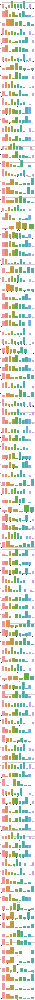

In [29]:
sns.set_style('whitegrid')

sns.catplot(data = inputs_df, x='activity_grp', col='student_id', col_wrap=1, kind='count', height=3, aspect=4, sharey=False, sharex=False)

plt.show()

#### The number of records per student by session

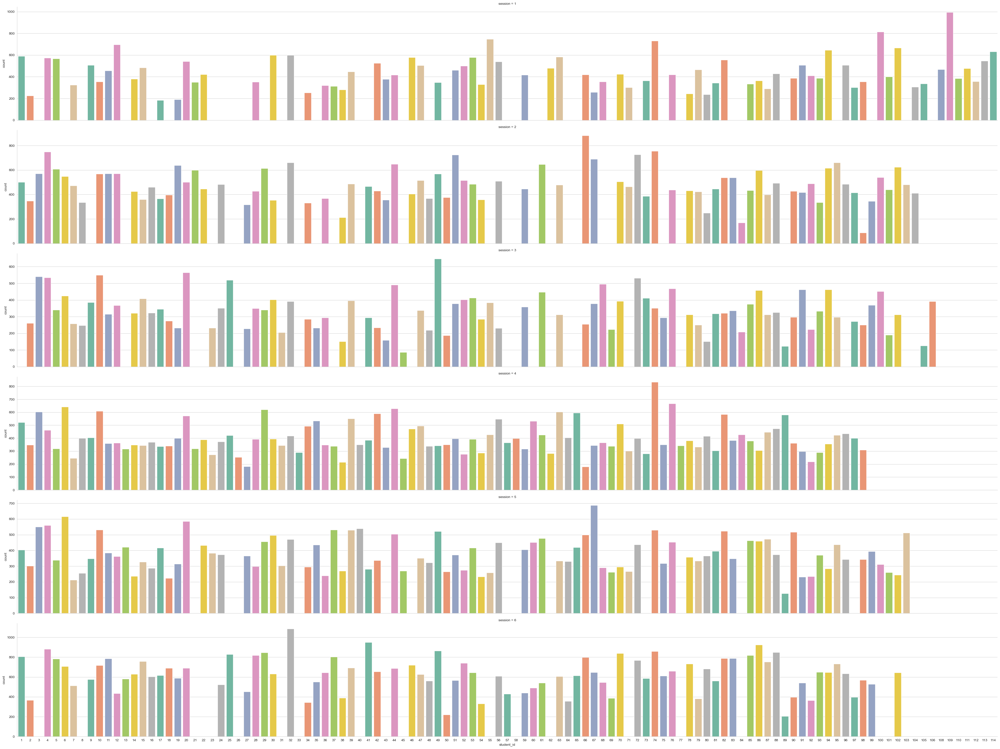

In [30]:
sns.catplot(data = inputs_df, x='student_id', col='session', col_wrap=1, kind='count', height=5, aspect=8, palette='Set2', sharey=False)

plt.show()

#### The number of records per session by student

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


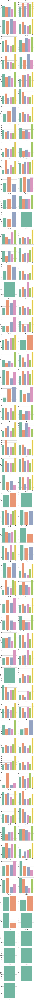

In [31]:
sns.catplot(data = inputs_df, x='session', col='student_id', col_wrap=2, kind='count', palette='Set2', sharey=False, sharex=False)

plt.show()

#### The distribution of numeric variables

I'm not sure how to visualize these variables - a lot of values are 0. If I use this dataset for the project, I will work on this.

In [32]:
inputs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 39 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   session            227129 non-null  int64  
 1   student_id         227129 non-null  int64  
 2   exercise           227129 non-null  object 
 3   activity           227129 non-null  object 
 4   activity_grp       227129 non-null  object 
 5   activity_ex        111979 non-null  object 
 6   start_time         227128 non-null  object 
 7   end_time           227129 non-null  object 
 8   total_time         167361 non-null  float64
 9   idle_time          226971 non-null  float64
 10  mouse_wheel        227129 non-null  int64  
 11  mouse_wheel_click  227129 non-null  int64  
 12  mouse_click_left   227129 non-null  int64  
 13  mouse_click_right  227129 non-null  int64  
 14  mouse_movement     227129 non-null  int64  
 15  keystroke          227129 non-null  int64  
 16  ac

In [33]:
inputs_df.describe()

,session,student_id,total_time,idle_time,mouse_wheel,mouse_wheel_click,mouse_click_left,mouse_click_right,mouse_movement,keystroke,...,mm_wdz,ks_wdz,ttime_sqrt,itime_sqrt,mw_sqrt,mwc_sqrt,mcl_sqrt,mcr_sqrt,mm_sqrt,ks_sqrt
count,227129.000000,227129.000000,1.673610e+05,2.269710e+05,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000,...,227129.000000,227129.000000,167361.000000,226971.000000,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000,227129.000000
mean,3.694596,52.893576,2.152479e+04,1.144022e+06,2.707109,0.005451,7.075939,0.336831,414.627828,6.281897,...,414.627828,6.281897,102.767426,221.136780,0.380204,0.002757,1.994965,0.114958,15.115336,0.661013
std,1.769361,31.141162,7.032397e+04,2.977009e+07,27.102855,0.224539,21.559259,3.023147,1275.832800,50.948421,...,1275.832800,50.948421,104.707762,1046.482145,1.600802,0.073777,1.759565,0.568873,13.643873,2.417640
min,1.000000,1.000000,1.000000e+03,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,31.622777,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,25.000000,2.000000e+03,0.000000e+00,0.000000,0.000000,2.000000,0.000000,62.000000,0.000000,...,62.000000,0.000000,44.721360,0.000000,0.000000,0.000000,1.414214,0.000000,7.874008,0.000000
50%,4.000000,53.000000,4.000000e+03,8.000000e+01,0.000000,0.000000,2.000000,0.000000,137.000000,0.000000,...,137.000000,0.000000,63.245553,8.944272,0.000000,0.000000,1.414214,0.000000,11.704700,0.000000
75%,5.000000,80.000000,1.500000e+04,5.740500e+03,0.000000,0.000000,5.000000,0.000000,335.000000,0.000000,...,335.000000,0.000000,122.474487,75.766087,0.000000,0.000000,2.236068,0.000000,18.303005,0.000000
max,6.000000,114.000000,3.861000e+06,7.244736e+09,2904.000000,60.000000,1096.000000,168.000000,85949.000000,4754.000000,...,85949.000000,4754.000000,1964.942747,85116.014486,53.888774,7.745967,33.105891,12.961481,293.170599,68.949257


In [34]:
inputs_lf = inputs_df.melt( id_vars=['session','student_id','exercise','activity_grp','activity_ex'], 
                  value_vars=['idle_time', 'mouse_wheel', 'mouse_wheel_click',
                              'mouse_click_left', 'mouse_click_right', 'mouse_movement', 'keystroke']).copy()

In [35]:
inputs_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1589903 entries, 0 to 1589902
Data columns (total 7 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   session       1589903 non-null  int64  
 1   student_id    1589903 non-null  int64  
 2   exercise      1589903 non-null  object 
 3   activity_grp  1589903 non-null  object 
 4   activity_ex   783853 non-null   object 
 5   variable      1589903 non-null  object 
 6   value         1589745 non-null  float64
dtypes: float64(1), int64(2), object(4)
memory usage: 84.9+ MB


/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


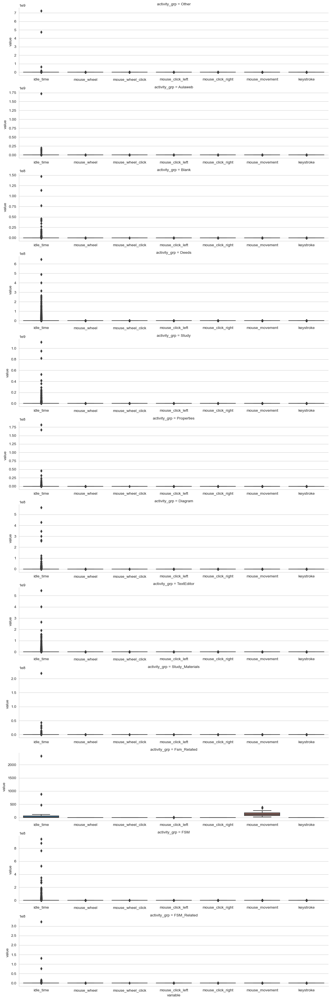

In [36]:
sns.catplot(data=inputs_lf, x='variable', y='value', 
            col = 'activity_grp', kind='box',
            col_wrap=1, height=3, aspect=4, 
            sharey=False, sharex=False)

plt.show()

In [37]:
from sklearn.preprocessing import StandardScaler

In [38]:
features = inputs_df.select_dtypes('number').copy()

In [39]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 33 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   session            227129 non-null  int64  
 1   student_id         227129 non-null  int64  
 2   total_time         167361 non-null  float64
 3   idle_time          226971 non-null  float64
 4   mouse_wheel        227129 non-null  int64  
 5   mouse_wheel_click  227129 non-null  int64  
 6   mouse_click_left   227129 non-null  int64  
 7   mouse_click_right  227129 non-null  int64  
 8   mouse_movement     227129 non-null  int64  
 9   keystroke          227129 non-null  int64  
 10  active_time        114002 non-null  float64
 11  ttime_ln           167361 non-null  float64
 12  itime_ln           144564 non-null  float64
 13  mw_ln              20962 non-null   float64
 14  mwc_ln             369 non-null     float64
 15  mcl_ln             203505 non-null  float64
 16  mc

In [40]:
Xact = StandardScaler().fit_transform( features )

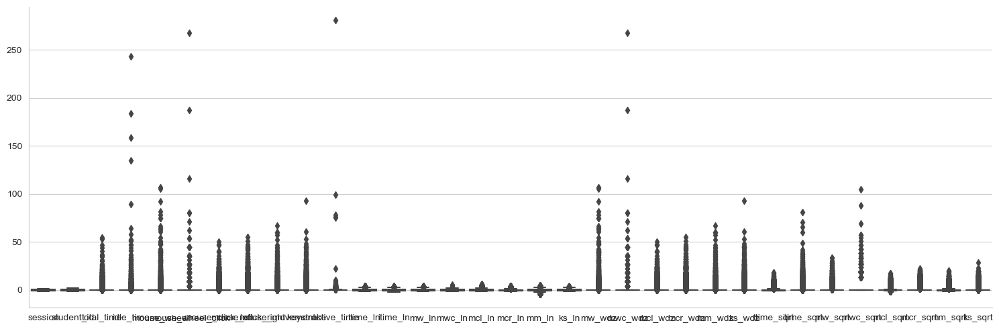

In [41]:
sns.catplot(data = pd.DataFrame(Xact, columns=features.columns),
            kind='box',
            aspect=3)

plt.show()

## Explore the intermediate output data

In [42]:
interim_df = interim_init.copy()

In [43]:
interim_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   student_id        115 non-null    int64  
 1   interim_s2_score  115 non-null    float64
 2   interim_s3_score  115 non-null    float64
 3   interim_s4_score  115 non-null    float64
 4   interim_s5_score  115 non-null    float64
 5   interim_s6_score  115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [44]:
interim_df

,student_id,interim_s2_score,interim_s3_score,interim_s4_score,interim_s5_score,interim_s6_score
0,1,5.0,0.0,4.5,4.0,2.25
1,2,4.0,3.5,4.5,4.0,1.00
2,3,3.5,3.5,4.5,4.0,0.00
3,4,6.0,4.0,5.0,3.5,2.75
4,5,5.0,4.0,5.0,4.0,2.75
...,...,...,...,...,...,...
110,111,3.0,0.0,0.0,3.0,0.00
111,112,0.0,0.0,0.0,0.0,0.00
112,113,0.0,0.0,0.0,0.0,0.00
113,114,0.0,0.0,0.0,0.0,0.00


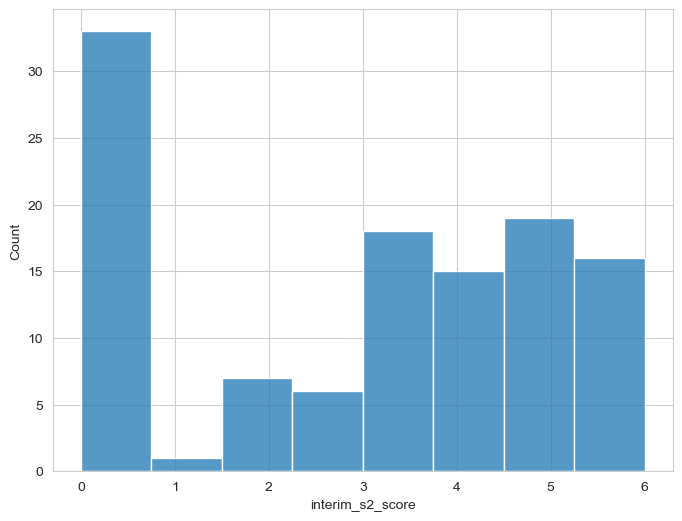

In [45]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_s2_score', ax=ax)

plt.show()

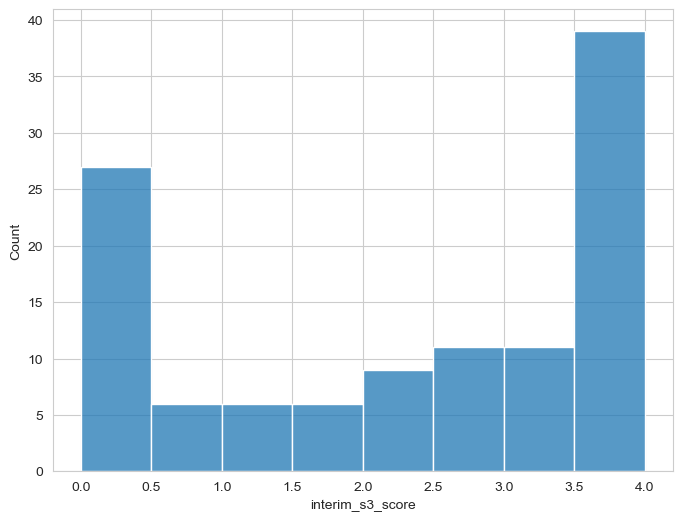

In [46]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_s3_score', ax=ax)

plt.show()

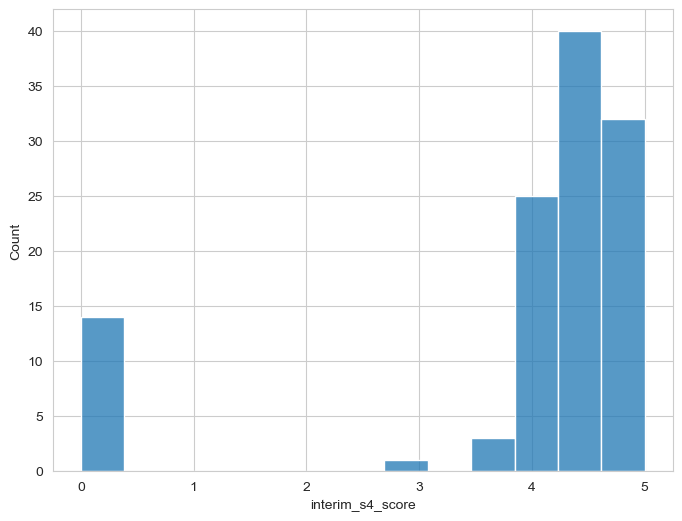

In [47]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_s4_score', ax=ax)

plt.show()

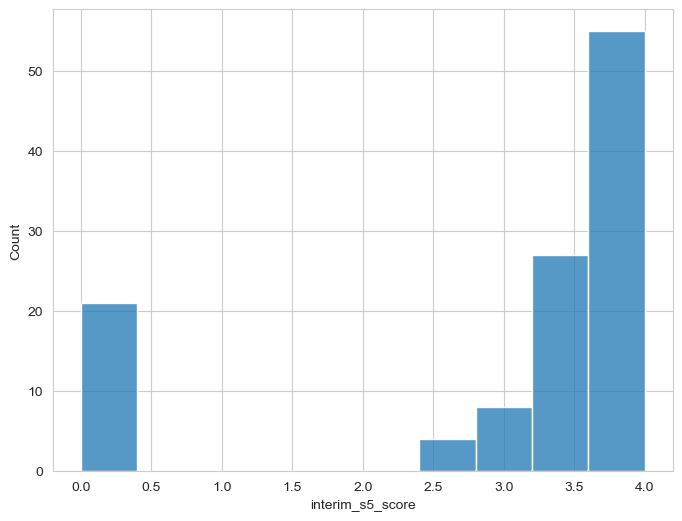

In [48]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_s5_score', ax=ax)

plt.show()

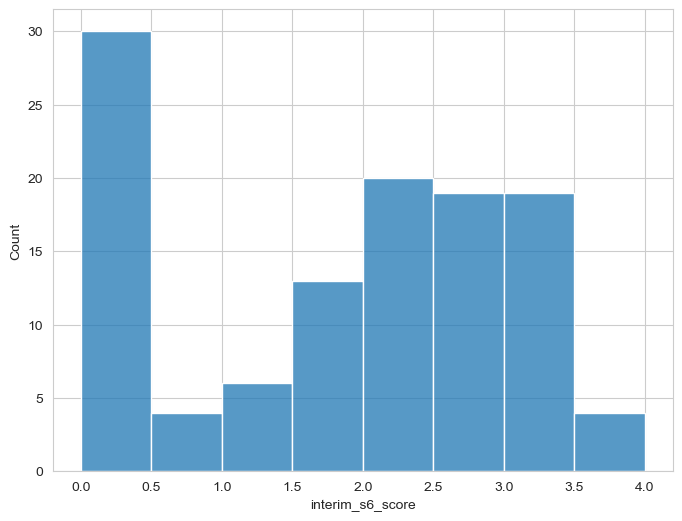

In [49]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=interim_df, x='interim_s6_score', ax=ax)

plt.show()

#### Point plots show the inermediate progress for each student

In [50]:
interim_lf = interim_df.melt( id_vars=['student_id']).\
             rename(columns={"variable": "interim_session", "value": "interim_score"}).\
             copy()

In [51]:
interim_lf['session'] = interim_lf.interim_session.str.extract('(\d+)')

In [52]:
interim_lf

,student_id,interim_session,interim_score,session
0,1,interim_s2_score,5.0,2
1,2,interim_s2_score,4.0,2
2,3,interim_s2_score,3.5,2
3,4,interim_s2_score,6.0,2
4,5,interim_s2_score,5.0,2
...,...,...,...,...
570,111,interim_s6_score,0.0,6
571,112,interim_s6_score,0.0,6
572,113,interim_s6_score,0.0,6
573,114,interim_s6_score,0.0,6


In [53]:
interim_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   student_id       575 non-null    int64  
 1   interim_session  575 non-null    object 
 2   interim_score    575 non-null    float64
 3   session          575 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 18.1+ KB


/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


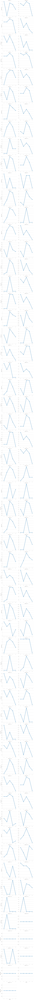

In [54]:
sns.catplot(data=interim_lf, x='session', y='interim_score', 
            col = 'student_id', kind='point',
            col_wrap=2, sharey=False, sharex=False)

plt.show()

## Explore the final output data

In [55]:
final_df = final_init.copy()

In [56]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   student_id   62 non-null     int64  
 1   Es_1_1       62 non-null     float64
 2   Es_1_2       62 non-null     float64
 3   Es_2_1       62 non-null     float64
 4   Es_2_2       62 non-null     float64
 5   Es_3_1       62 non-null     float64
 6   Es_3_2       62 non-null     float64
 7   Es_3_3       62 non-null     float64
 8   Es_3_4       62 non-null     float64
 9   Es_3_5       62 non-null     float64
 10  Es_4_1       62 non-null     float64
 11  Es_4_2       62 non-null     float64
 12  Es_5_1       62 non-null     float64
 13  Es_5_2       62 non-null     float64
 14  Es_5_3       62 non-null     float64
 15  Es_6_1       62 non-null     float64
 16  Es_6_2       62 non-null     float64
 17  final_score  62 non-null     float64
 18  pass_final   62 non-null     int64  
dtypes: float64

In [57]:
pts_final_init.columns

Index(['question', 'question_pts'], dtype='object')

In [58]:
pts_final = pts_final_init[['question', 'question_pts']].copy()

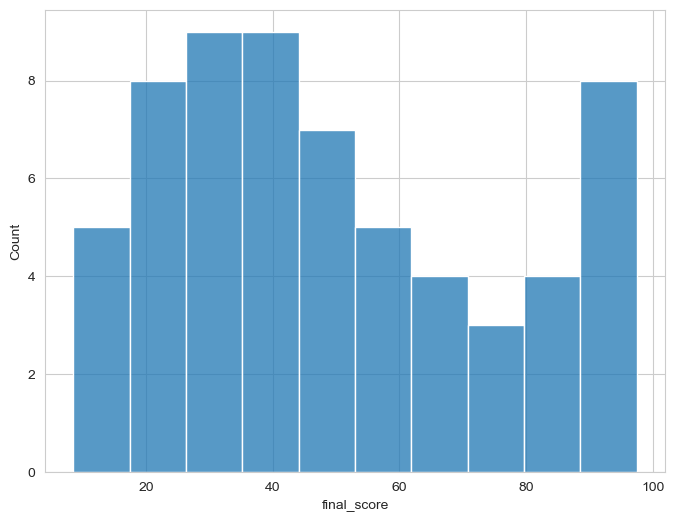

In [59]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=final_df, x='final_score', ax=ax, bins=10)

plt.show()

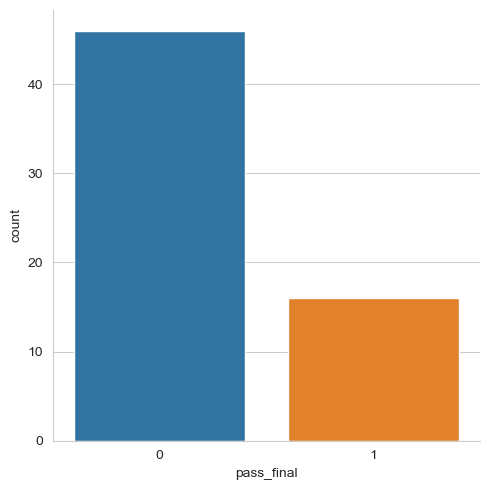

In [60]:
sns.catplot(data = final_df, x='pass_final', kind='count')

plt.show()

In [61]:
final_df['pass_final'].mean()

0.25806451612903225

#### Look at scores for each question of the question score by student

In [62]:
final_lf = final_df.melt( id_vars=['student_id', 'final_score', 'pass_final']).\
           rename(columns={"variable": "question_on_final", 
                           "value": "question_score_on_final"}).\
           copy()

In [63]:
final_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 992 entries, 0 to 991
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   student_id               992 non-null    int64  
 1   final_score              992 non-null    float64
 2   pass_final               992 non-null    int64  
 3   question_on_final        992 non-null    object 
 4   question_score_on_final  992 non-null    float64
dtypes: float64(2), int64(2), object(1)
memory usage: 38.9+ KB


In [64]:
final_comp_lf = pd.merge(final_lf, pts_final, 
                          left_on=['question_on_final'],
                          right_on=['question']).\
                          drop(columns=['question']).\
                          copy()

In [65]:
final_comp_lf.sort_values(by=['student_id'])

,student_id,final_score,pass_final,question_on_final,question_score_on_final,question_pts
0,1,94.5,1,Es_1_1,2.0,2
124,1,94.5,1,Es_2_1,1.0,2
806,1,94.5,1,Es_5_3,3.0,3
620,1,94.5,1,Es_4_2,10.0,10
868,1,94.5,1,Es_6_1,25.0,25
...,...,...,...,...,...,...
185,106,71.0,1,Es_2_1,1.0,2
123,106,71.0,1,Es_1_2,3.0,3
61,106,71.0,1,Es_1_1,2.0,2
929,106,71.0,1,Es_6_1,25.0,25


In [66]:
final_comp_lf['question_pct'] = final_comp_lf['question_score_on_final'] / final_comp_lf['question_pts']

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


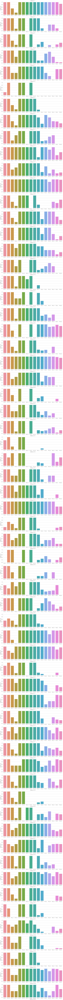

In [67]:
sns.catplot(data=final_comp_lf, x='question_on_final', y='question_pct', 
            col = 'student_id', kind='bar',
            col_wrap=1, sharey=False, sharex=False, 
            height=3, aspect=4)

plt.show()

### Explore input and output data by student

#### There is a positive relationship between the final score and final questions `final_Es_4_2`, `final_Es_6_1`, and `final_Es_6_2`. If students did well on these questions, they did well on the exam. Together these questions are worth 50% of the final score. 

#### The total time spent did not appear to have an effect on whether a student passed the final. However, the number of sessions and the variety of exercises and activities in which students participated did have an effect. While participating in more sessions and in a variety of exercise and activities did not guarantee a passing score, if students did not participate in at least four sessions (with the exception of two students) and in a variety of exercises and activities, they did not pass.

In [68]:
inputs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 39 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   session            227129 non-null  int64  
 1   student_id         227129 non-null  int64  
 2   exercise           227129 non-null  object 
 3   activity           227129 non-null  object 
 4   activity_grp       227129 non-null  object 
 5   activity_ex        111979 non-null  object 
 6   start_time         227128 non-null  object 
 7   end_time           227129 non-null  object 
 8   total_time         167361 non-null  float64
 9   idle_time          226971 non-null  float64
 10  mouse_wheel        227129 non-null  int64  
 11  mouse_wheel_click  227129 non-null  int64  
 12  mouse_click_left   227129 non-null  int64  
 13  mouse_click_right  227129 non-null  int64  
 14  mouse_movement     227129 non-null  int64  
 15  keystroke          227129 non-null  int64  
 16  ac

In [69]:
student_summ = inputs_df.groupby(['student_id']).\
            aggregate(total_time_avg = ('total_time', 'mean'),
                      active_time_avg = ('active_time', 'mean'),
                      idle_time_avg = ('idle_time', 'mean'),
                      mouse_wheel_avg = ('mouse_wheel', 'mean'),
                      mouse_wheel_click_avg = ('mouse_wheel_click', 'mean'),
                      mouse_click_left_avg = ('mouse_click_left', 'mean'),
                      mouse_click_right_avg = ('mouse_click_right', 'mean'),
                      mouse_movement_avg = ('mouse_movement', 'mean'),
                      keystroke_avg = ('keystroke', 'mean'),
                      session_count = ('session', 'nunique'),
                      exercise_count = ('exercise', 'nunique'),
                      activity_count = ('activity_grp', 'nunique')).\
            reset_index().copy()

In [70]:
student_summ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 0 to 112
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   student_id             113 non-null    int64  
 1   total_time_avg         113 non-null    float64
 2   active_time_avg        113 non-null    float64
 3   idle_time_avg          113 non-null    float64
 4   mouse_wheel_avg        113 non-null    float64
 5   mouse_wheel_click_avg  113 non-null    float64
 6   mouse_click_left_avg   113 non-null    float64
 7   mouse_click_right_avg  113 non-null    float64
 8   mouse_movement_avg     113 non-null    float64
 9   keystroke_avg          113 non-null    float64
 10  session_count          113 non-null    int64  
 11  exercise_count         113 non-null    int64  
 12  activity_count         113 non-null    int64  
dtypes: float64(9), int64(4)
memory usage: 11.6 KB


In [71]:
interim_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   student_id        115 non-null    int64  
 1   interim_s2_score  115 non-null    float64
 2   interim_s3_score  115 non-null    float64
 3   interim_s4_score  115 non-null    float64
 4   interim_s5_score  115 non-null    float64
 5   interim_s6_score  115 non-null    float64
dtypes: float64(5), int64(1)
memory usage: 5.5 KB


In [72]:
final_df.columns

Index(['student_id', 'Es_1_1', 'Es_1_2', 'Es_2_1', 'Es_2_2', 'Es_3_1',
       'Es_3_2', 'Es_3_3', 'Es_3_4', 'Es_3_5', 'Es_4_1', 'Es_4_2', 'Es_5_1',
       'Es_5_2', 'Es_5_3', 'Es_6_1', 'Es_6_2', 'final_score', 'pass_final'],
      dtype='object')

In [73]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   student_id   62 non-null     int64  
 1   Es_1_1       62 non-null     float64
 2   Es_1_2       62 non-null     float64
 3   Es_2_1       62 non-null     float64
 4   Es_2_2       62 non-null     float64
 5   Es_3_1       62 non-null     float64
 6   Es_3_2       62 non-null     float64
 7   Es_3_3       62 non-null     float64
 8   Es_3_4       62 non-null     float64
 9   Es_3_5       62 non-null     float64
 10  Es_4_1       62 non-null     float64
 11  Es_4_2       62 non-null     float64
 12  Es_5_1       62 non-null     float64
 13  Es_5_2       62 non-null     float64
 14  Es_5_3       62 non-null     float64
 15  Es_6_1       62 non-null     float64
 16  Es_6_2       62 non-null     float64
 17  final_score  62 non-null     float64
 18  pass_final   62 non-null     int64  
dtypes: float64

In [74]:
by_student_init = pd.merge(interim_df, student_summ, on='student_id', how='left')

In [75]:
by_student_init2 = pd.merge(by_student_init, final_df, on='student_id', how='left')

In [76]:
by_student_init2['took_final'] = np.where(by_student_init2.final_score.isnull(), 0, 1)

In [77]:
by_student_init2.rename(columns={"Es_1_1": "final_Es_1_1", "Es_1_2": "final_Es_1_2", "Es_2_1": "final_Es_2_1", 
                              "Es_2_2": "final_Es_2_2", "Es_3_1": "final_Es_3_1", "Es_3_2": "final_Es_3_2", 
                              "Es_3_3": "final_Es_3_3", "Es_3_4": "final_Es_3_4", "Es_3_5": "final_Es_3_5", 
                              "Es_4_1": "final_Es_4_1", "Es_4_2": "final_Es_4_2", "Es_5_1": "final_Es_5_1", 
                              "Es_5_2": "final_Es_5_2", "Es_5_3": "final_Es_5_3", "Es_6_1": "final_Es_6_1", 
                              "Es_6_2": "final_Es_6_2"}, inplace=True)

In [78]:
by_student_init2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115 entries, 0 to 114
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   student_id             115 non-null    int64  
 1   interim_s2_score       115 non-null    float64
 2   interim_s3_score       115 non-null    float64
 3   interim_s4_score       115 non-null    float64
 4   interim_s5_score       115 non-null    float64
 5   interim_s6_score       115 non-null    float64
 6   total_time_avg         113 non-null    float64
 7   active_time_avg        113 non-null    float64
 8   idle_time_avg          113 non-null    float64
 9   mouse_wheel_avg        113 non-null    float64
 10  mouse_wheel_click_avg  113 non-null    float64
 11  mouse_click_left_avg   113 non-null    float64
 12  mouse_click_right_avg  113 non-null    float64
 13  mouse_movement_avg     113 non-null    float64
 14  keystroke_avg          113 non-null    float64
 15  sessio

In [79]:
by_student_df = by_student_init2.copy()

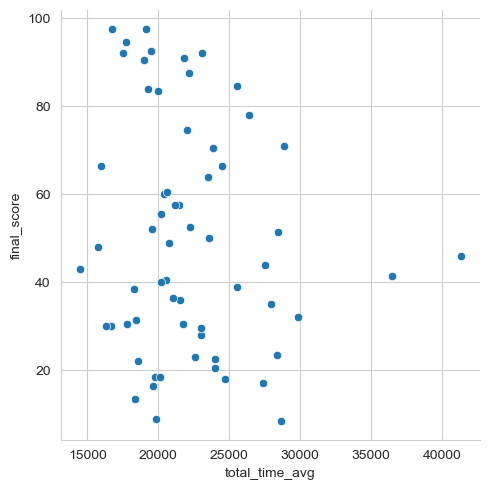

In [80]:
sns.relplot(data = by_student_df, x='total_time_avg', y='final_score', kind='scatter')

plt.show()

In [81]:
by_student_df.columns

Index(['student_id', 'interim_s2_score', 'interim_s3_score',
       'interim_s4_score', 'interim_s5_score', 'interim_s6_score',
       'total_time_avg', 'active_time_avg', 'idle_time_avg', 'mouse_wheel_avg',
       'mouse_wheel_click_avg', 'mouse_click_left_avg',
       'mouse_click_right_avg', 'mouse_movement_avg', 'keystroke_avg',
       'session_count', 'exercise_count', 'activity_count', 'final_Es_1_1',
       'final_Es_1_2', 'final_Es_2_1', 'final_Es_2_2', 'final_Es_3_1',
       'final_Es_3_2', 'final_Es_3_3', 'final_Es_3_4', 'final_Es_3_5',
       'final_Es_4_1', 'final_Es_4_2', 'final_Es_5_1', 'final_Es_5_2',
       'final_Es_5_3', 'final_Es_6_1', 'final_Es_6_2', 'final_score',
       'pass_final', 'took_final'],
      dtype='object')

In [82]:
by_student_lf = by_student_df.melt(id_vars=['student_id', 'final_score', 'pass_final', 'took_final'])

In [83]:
by_student_lf.isna().sum()

student_id        0
final_score    1749
pass_final     1749
took_final        0
variable          0
value           872
dtype: int64

In [84]:
by_student_lf.variable.unique()

array(['interim_s2_score', 'interim_s3_score', 'interim_s4_score',
       'interim_s5_score', 'interim_s6_score', 'total_time_avg',
       'active_time_avg', 'idle_time_avg', 'mouse_wheel_avg',
       'mouse_wheel_click_avg', 'mouse_click_left_avg',
       'mouse_click_right_avg', 'mouse_movement_avg', 'keystroke_avg',
       'session_count', 'exercise_count', 'activity_count',
       'final_Es_1_1', 'final_Es_1_2', 'final_Es_2_1', 'final_Es_2_2',
       'final_Es_3_1', 'final_Es_3_2', 'final_Es_3_3', 'final_Es_3_4',
       'final_Es_3_5', 'final_Es_4_1', 'final_Es_4_2', 'final_Es_5_1',
       'final_Es_5_2', 'final_Es_5_3', 'final_Es_6_1', 'final_Es_6_2'],
      dtype=object)

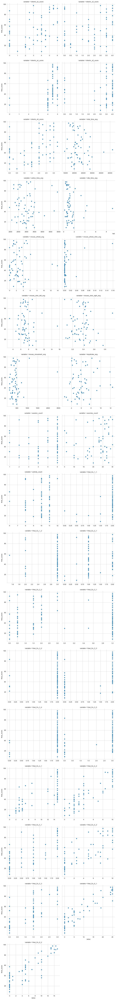

In [85]:
sns.relplot(data = by_student_lf, x='value', y='final_score', 
            col='variable', col_wrap=2, 
            kind='scatter', facet_kws={'sharex': False})

plt.show()

In [86]:
pts_final

,question,question_pts
0,Es_1_1,2
1,Es_1_2,3
2,Es_2_1,2
3,Es_2_2,3
4,Es_3_1,1
5,Es_3_2,2
6,Es_3_3,2
7,Es_3_4,2
8,Es_3_5,3
9,Es_4_1,15


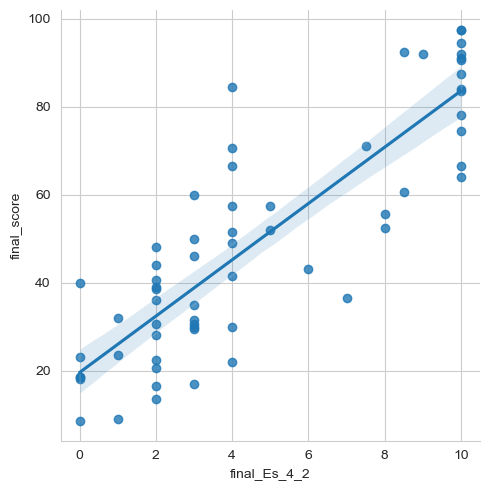

In [87]:
sns.lmplot(data = by_student_df, x='final_Es_4_2', y='final_score')

plt.show()

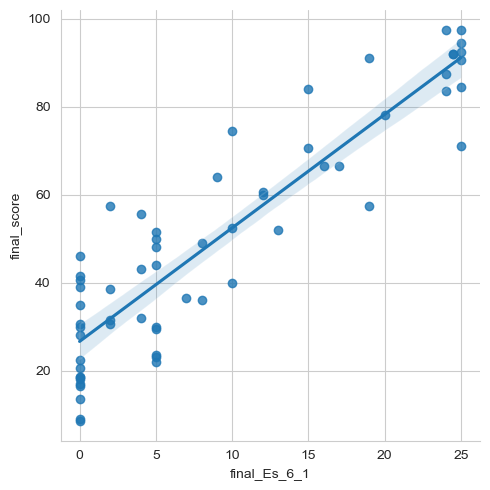

In [88]:
sns.lmplot(data = by_student_df, x='final_Es_6_1', y='final_score')

plt.show()

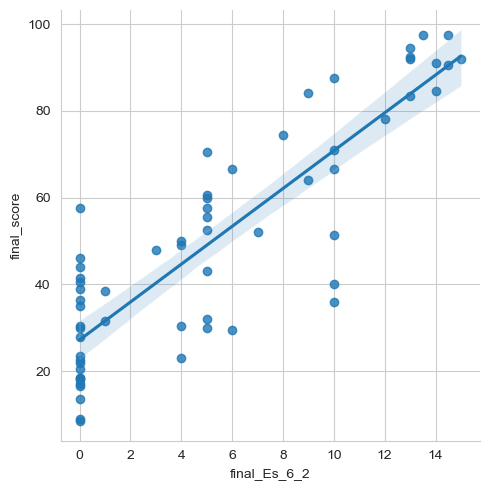

In [89]:
sns.lmplot(data = by_student_df, x='final_Es_6_2', y='final_score')

plt.show()

#### The box plots below show that participation in the session, exercises, and activities influences final grades

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


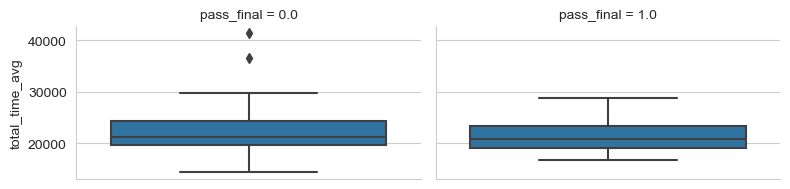

In [90]:
sns.catplot(data=by_student_df, 
            y='total_time_avg', col='pass_final', kind='box',
            sharex = False, height=2, aspect=2)

plt.show()

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


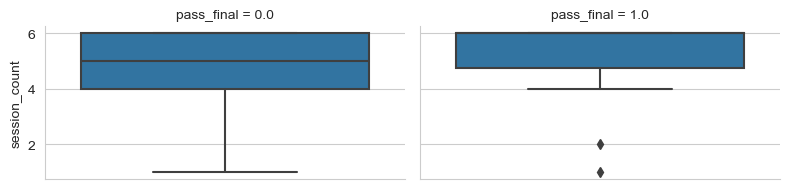

In [91]:
sns.catplot(data=by_student_df, 
            y='session_count', col='pass_final', kind='box',
            sharex = False, height=2, aspect=2)

plt.show()

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


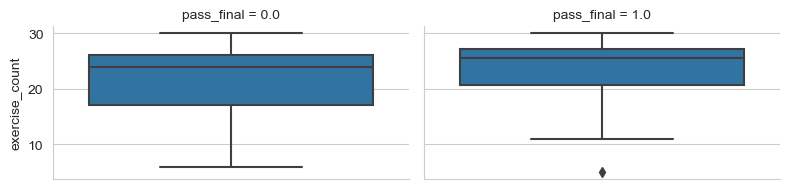

In [92]:
sns.catplot(data=by_student_df, 
            y='exercise_count', col='pass_final', kind='box',
            sharex = False, height=2, aspect=2)

plt.show()

/Users/lisaover/opt/anaconda3/envs/cmpinf2120/lib/python3.8/site-packages/seaborn/categorical.py:3201: UserWarning: Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharex", "x"), UserWarning)


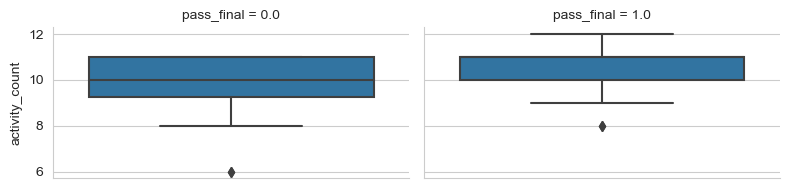

In [93]:
sns.catplot(data=by_student_df, 
            y='activity_count', col='pass_final', kind='box',
            sharex = False, height=2, aspect=2)

plt.show()

fig, ax = plt.subplots(figsize=(24,18))

sns.heatmap(pd.crosstab(inputs_df.session, inputs_df.activity_grp), 
            annot=True, annot_kws={'size': 25},
            cbar=False, fmt="d")

plt.show()

### Create summary and output for modeling

In [94]:
inputs_df.columns

Index(['session', 'student_id', 'exercise', 'activity', 'activity_grp',
       'activity_ex', 'start_time', 'end_time', 'total_time', 'idle_time',
       'mouse_wheel', 'mouse_wheel_click', 'mouse_click_left',
       'mouse_click_right', 'mouse_movement', 'keystroke', 'active_time',
       'ttime_ln', 'itime_ln', 'mw_ln', 'mwc_ln', 'mcl_ln', 'mcr_ln', 'mm_ln',
       'ks_ln', 'mw_wdz', 'mwc_wdz', 'mcl_wdz', 'mcr_wdz', 'mm_wdz', 'ks_wdz',
       'ttime_sqrt', 'itime_sqrt', 'mw_sqrt', 'mwc_sqrt', 'mcl_sqrt',
       'mcr_sqrt', 'mm_sqrt', 'ks_sqrt'],
      dtype='object')

In [95]:
inputs_renamed = inputs_df.rename(columns={'activity_grp': 'act_grp',
       'activity_ex': 'act_ex', 'start_time': 'start_tm', 'end_tm': '', 'total_time': 'ttime', 'idle_time': 'itime',
       'mouse_wheel': 'mw', 'mouse_wheel_click': 'mwc', 'mouse_click_left': 'mcl',
       'mouse_click_right': 'mcr', 'mouse_movement': 'mm', 'keystroke': 'ks', 'active_time': 'atime' 
})

In [96]:
inputs_renamed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227129 entries, 0 to 227128
Data columns (total 39 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   session     227129 non-null  int64  
 1   student_id  227129 non-null  int64  
 2   exercise    227129 non-null  object 
 3   activity    227129 non-null  object 
 4   act_grp     227129 non-null  object 
 5   act_ex      111979 non-null  object 
 6   start_tm    227128 non-null  object 
 7   end_time    227129 non-null  object 
 8   ttime       167361 non-null  float64
 9   itime       226971 non-null  float64
 10  mw          227129 non-null  int64  
 11  mwc         227129 non-null  int64  
 12  mcl         227129 non-null  int64  
 13  mcr         227129 non-null  int64  
 14  mm          227129 non-null  int64  
 15  ks          227129 non-null  int64  
 16  atime       114002 non-null  float64
 17  ttime_ln    167361 non-null  float64
 18  itime_ln    144564 non-null  float64
 19  mw

In [97]:
def q1(x):
    return x.quantile(0.25)

In [98]:
def q3(x):
    return x.quantile(0.75)

In [101]:
student_summ_out = inputs_renamed.groupby(['session','student_id']).\
            aggregate(ttime_avg = ('ttime', 'mean'),
                      atime_avg = ('atime', 'mean'),
                      itime_avg = ('itime', 'mean'),
                      mw_avg = ('mw', 'mean'),
                      mwc_avg = ('mwc', 'mean'),
                      mcl_avg = ('mcl', 'mean'),
                      mcr_avg = ('mcr', 'mean'),
                      mm_avg = ('mm', 'mean'),
                      ks_avg = ('ks', 'mean'),
                      ttime_var = ('ttime', 'var'),
                      atime_var = ('atime', 'var'),
                      itime_var = ('itime', 'var'),
                      mw_var = ('mw', 'var'),
                      mwc_var = ('mwc', 'var'),
                      mcl_var = ('mcl', 'var'),
                      mcr_var = ('mcr', 'var'),
                      mm_var = ('mm', 'var'),
                      ks_var = ('ks', 'var'),
                      ttime_q1 = ('ttime', q1),
                      atime_q1 = ('atime', q1),
                      itime_q1 = ('itime', q1),
                      mw_q1 = ('mw', q1),
                      mwc_q1 = ('mwc', q1),
                      mcl_q1 = ('mcl', q1),
                      mcr_q1 = ('mcr', q1),
                      mm_q1 = ('mm', q1),
                      ks_q1 = ('ks', q1),
                      ttime_med = ('ttime', 'median'),
                      atime_med = ('atime', 'median'),
                      itime_med = ('itime', 'median'),
                      mw_med = ('mw', 'median'),
                      mwc_med = ('mwc', 'median'),
                      mcl_med = ('mcl', 'median'),
                      mcr_med = ('mcr', 'median'),
                      mm_med = ('mm', 'median'),
                      ks_med = ('ks', 'median'),
                      ttime_q3 = ('ttime', q3),
                      atime_q3 = ('atime', q3),
                      itime_q3 = ('itime', q3),
                      mw_q3 = ('mw', q3),
                      mwc_q3 = ('mwc', q3),
                      mcl_q3 = ('mcl', q3),
                      mcr_q3 = ('mcr', q3),
                      mm_q3 = ('mm', q3),
                      ks_q3 = ('ks', q3),
                      ttime_max = ('ttime', 'max'),
                      atime_max = ('atime', 'max'),
                      itime_max = ('itime', 'max'),
                      mw_max = ('mw', 'max'),
                      mwc_max = ('mwc', 'max'),
                      mcl_max = ('mcl', 'max'),
                      mcr_max = ('mcr', 'max'),
                      mm_max = ('mm', 'max'),
                      ks_max = ('ks', 'max'),
                      
                      ttime_ln_avg = ('ttime_ln', 'mean'),
                      itime_ln_avg = ('itime_ln', 'mean'),
                      mw_ln_avg = ('mw_ln', 'mean'),
                      mwc_ln_avg = ('mwc_ln', 'mean'),
                      mcl_ln_avg = ('mcl_ln', 'mean'),
                      mcr_ln_avg = ('mcr_ln', 'mean'),
                      mm_ln_avg = ('mm_ln', 'mean'),
                      ks_ln_avg = ('ks_ln', 'mean'),
                      ttime_ln_var = ('ttime_ln', 'var'),
                      itime_ln_var = ('itime_ln', 'var'),
                      mw_ln_var = ('mw_ln', 'var'),
                      mwc_ln_var = ('mwc_ln', 'var'),
                      mcl_ln_var = ('mcl_ln', 'var'),
                      mcr_ln_var = ('mcr_ln', 'var'),
                      mm_ln_var = ('mm_ln', 'var'),
                      ks_ln_var = ('ks_ln', 'var'),
                      ttime_ln_q1 = ('ttime_ln', q1),
                      itime_ln_q1 = ('itime_ln', q1),
                      mw_ln_q1 = ('mw_ln', q1),
                      mwc_ln_q1 = ('mwc_ln', q1),
                      mcl_ln_q1 = ('mcl_ln', q1),
                      mcr_ln_q1 = ('mcr_ln', q1),
                      mm_ln_q1 = ('mm_ln', q1),
                      ks_ln_q1 = ('ks_ln', q1),
                      ttime_ln_med = ('ttime_ln', 'median'),
                      itime_ln_med = ('itime_ln', 'median'),
                      mw_ln_med = ('mw_ln', 'median'),
                      mwc_ln_med = ('mwc_ln', 'median'),
                      mcl_ln_med = ('mcl_ln', 'median'),
                      mcr_ln_med = ('mcr_ln', 'median'),
                      mm_ln_med = ('mm_ln', 'median'),
                      ks_ln_med = ('ks_ln', 'median'),
                      ttime_ln_q3 = ('ttime_ln', q3),
                      itime_ln_q3 = ('itime_ln', q3),
                      mw_ln_q3 = ('mw_ln', q3),
                      mwc_ln_q3 = ('mwc_ln', q3),
                      mcl_ln_q3 = ('mcl_ln', q3),
                      mcr_ln_q3 = ('mcr_ln', q3),
                      mm_ln_q3 = ('mm_ln', q3),
                      ks_ln_q3 = ('ks_ln', q3),
                      ttime_ln_max = ('ttime_ln', 'max'),
                      itime_ln_max = ('itime_ln', 'max'),
                      mw_ln_max = ('mw_ln', 'max'),
                      mwc_ln_max = ('mwc_ln', 'max'),
                      mcl_ln_max = ('mcl_ln', 'max'),
                      mcr_ln_max = ('mcr_ln', 'max'),
                      mm_ln_max = ('mm_ln', 'max'),
                      ks_ln_max = ('ks_ln', 'max'),
                      
                      mw_wdz_avg = ('mw_wdz', 'mean'),
                      mwc_wdz_avg = ('mwc_wdz', 'mean'),
                      mcl_wdz_avg = ('mcl_wdz', 'mean'),
                      mcr_wdz_avg = ('mcr_wdz', 'mean'),
                      mm_wdz_avg = ('mm_wdz', 'mean'),
                      ks_wdz_avg = ('ks_wdz', 'mean'),
                      mw_wdz_var = ('mw_wdz', 'var'),
                      mwc_wdz_var = ('mwc_wdz', 'var'),
                      mcl_wdz_var = ('mcl_wdz', 'var'),
                      mcr_wdz_var = ('mcr_wdz', 'var'),
                      mm_wdz_var = ('mm_wdz', 'var'),
                      ks_wdz_var = ('ks_wdz', 'var'),
                      mw_wdz_q1 = ('mw_wdz', q1),
                      mwc_wdz_q1 = ('mwc_wdz', q1),
                      mcl_wdz_q1 = ('mcl_wdz', q1),
                      mcr_wdz_q1 = ('mcr_wdz', q1),
                      mm_wdz_q1 = ('mm_wdz', q1),
                      ks_wdz_q1 = ('ks_wdz', q1),
                      mw_wdz_med = ('mw_wdz', 'median'),
                      mwc_wdz_med = ('mwc_wdz', 'median'),
                      mcl_wdz_med = ('mcl_wdz', 'median'),
                      mcr_wdz_med = ('mcr_wdz', 'median'),
                      mm_wdz_med = ('mm_wdz', 'median'),
                      ks_wdz_med = ('ks_wdz', 'median'),
                      mw_wdz_q3 = ('mw_wdz', q3),
                      mwc_wdz_q3 = ('mwc_wdz', q3),
                      mcl_wdz_q3 = ('mcl_wdz', q3),
                      mcr_wdz_q3 = ('mcr_wdz', q3),
                      mm_wdz_q3 = ('mm_wdz', q3),
                      ks_wdz_q3 = ('ks_wdz', q3),
                      mw_wdz_max = ('mw_wdz', 'max'),
                      mwc_wdz_max = ('mwc_wdz', 'max'),
                      mcl_wdz_max = ('mcl_wdz', 'max'),
                      mcr_wdz_max = ('mcr_wdz', 'max'),
                      mm_wdz_max = ('mm_wdz', 'max'),
                      ks_wdz_max = ('ks_wdz', 'max'),
                      
                      ttime_sqrt_avg = ('ttime_sqrt', 'mean'),
                      itime_sqrt_avg = ('itime_sqrt', 'mean'),
                      mw_sqrt_avg = ('mw_sqrt', 'mean'),
                      mwc_sqrt_avg = ('mwc_sqrt', 'mean'),
                      mcl_sqrt_avg = ('mcl_sqrt', 'mean'),
                      mcr_sqrt_avg = ('mcr_sqrt', 'mean'),
                      mm_sqrt_avg = ('mm_sqrt', 'mean'),
                      ks_sqrt_avg = ('ks_sqrt', 'mean'),
                      ttime_sqrt_var = ('ttime_sqrt', 'var'),
                      itime_sqrt_var = ('itime_sqrt', 'var'),
                      mw_sqrt_var = ('mw_sqrt', 'var'),
                      mwc_sqrt_var = ('mwc_sqrt', 'var'),
                      mcl_sqrt_var = ('mcl_sqrt', 'var'),
                      mcr_sqrt_var = ('mcr_sqrt', 'var'),
                      mm_sqrt_var = ('mm_sqrt', 'var'),
                      ks_sqrt_var = ('ks_sqrt', 'var'),
                      ttime_sqrt_q1 = ('ttime_sqrt', q1),
                      itime_sqrt_q1 = ('itime_sqrt', q1),
                      mw_sqrt_q1 = ('mw_sqrt', q1),
                      mwc_sqrt_q1 = ('mwc_sqrt', q1),
                      mcl_sqrt_q1 = ('mcl_sqrt', q1),
                      mcr_sqrt_q1 = ('mcr_sqrt', q1),
                      mm_sqrt_q1 = ('mm_sqrt', q1),
                      ks_sqrt_q1 = ('ks_sqrt', q1),
                      ttime_sqrt_med = ('ttime_sqrt', 'median'),
                      itime_sqrt_med = ('itime_sqrt', 'median'),
                      mw_sqrt_med = ('mw_sqrt', 'median'),
                      mwc_sqrt_med = ('mwc_sqrt', 'median'),
                      mcl_sqrt_med = ('mcl_sqrt', 'median'),
                      mcr_sqrt_med = ('mcr_sqrt', 'median'),
                      mm_sqrt_med = ('mm_sqrt', 'median'),
                      ks_sqrt_med = ('ks_sqrt', 'median'),
                      ttime_sqrt_q3 = ('ttime_sqrt', q3),
                      itime_sqrt_q3 = ('itime_sqrt', q3),
                      mw_sqrt_q3 = ('mw_sqrt', q3),
                      mwc_sqrt_q3 = ('mwc_sqrt', q3),
                      mcl_sqrt_q3 = ('mcl_sqrt', q3),
                      mcr_sqrt_q3 = ('mcr_sqrt', q3),
                      mm_sqrt_q3 = ('mm_sqrt', q3),
                      ks_sqrt_q3 = ('ks_sqrt', q3),
                      ttime_sqrt_max = ('ttime_sqrt', 'max'),
                      itime_sqrt_max = ('itime_sqrt', 'max'),
                      mw_sqrt_max = ('mw_sqrt', 'max'),
                      mwc_sqrt_max = ('mwc_sqrt', 'max'),
                      mcl_sqrt_max = ('mcl_sqrt', 'max'),
                      mcr_sqrt_max = ('mcr_sqrt', 'max'),
                      mm_sqrt_max = ('mm_sqrt', 'max'),
                      ks_sqrt_max = ('ks_sqrt', 'max'),
                      
                      exercise_count = ('exercise', 'nunique'),
                      activity_count = ('activity', 'nunique'),
                      act_grp_count = ('act_grp', 'nunique')).\
            reset_index().copy()

In [108]:
student_summ_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 514 entries, 0 to 513
Columns: 191 entries, session to act_grp_count
dtypes: float64(174), int64(17)
memory usage: 767.1 KB


In [109]:
student_summ_out.head()

,session,student_id,ttime_avg,atime_avg,itime_avg,mw_avg,mwc_avg,mcl_avg,mcr_avg,mm_avg,...,itime_sqrt_max,mw_sqrt_max,mwc_sqrt_max,mcl_sqrt_max,mcr_sqrt_max,mm_sqrt_max,ks_sqrt_max,exercise_count,activity_count,act_grp_count
0,1,1,15009.132420,3376.793388,166911.101523,0.761421,0.000000,7.302876,0.497462,549.868020,...,4497.042361,8.306624,0.000000,15.165751,7.348469,130.268953,10.295630,5,20,8
1,1,2,25941.860465,2879.938144,813225.650442,0.000000,0.000000,0.008850,0.000000,0.362832,...,9411.974713,0.000000,0.000000,1.414214,0.000000,6.708204,13.856406,5,18,8
2,1,4,11870.731707,2293.512000,136401.900697,0.000000,0.000000,0.536585,0.013937,18.217770,...,5236.779927,0.000000,0.000000,14.282857,2.000000,79.385137,12.489996,5,19,8
3,1,5,11717.647059,3548.954802,88854.186949,1.088183,0.000000,4.700176,0.088183,462.807760,...,3778.930669,6.164414,0.000000,13.266499,2.449490,108.963297,11.313708,5,19,8
4,1,7,19687.500000,2650.825137,585058.067692,0.000000,0.055385,7.630769,0.196923,360.021538,...,5775.068917,0.000000,3.464102,14.628739,4.000000,100.712462,12.328828,5,19,8


In [102]:
interim_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   student_id       575 non-null    int64  
 1   interim_session  575 non-null    object 
 2   interim_score    575 non-null    float64
 3   session          575 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 18.1+ KB


In [104]:
interim_lf['session'] = interim_lf['session'].astype('int')

In [105]:
out_df = pd.merge(interim_lf, student_summ_out, on=['student_id', 'session'], how='left')

In [106]:
out_df.to_csv('inputs_interim.csv')